# import a lot of libraries

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_s_curve
import torch as t
import torch.nn as nn

# make dataset

In [2]:
s_curve ,_ = make_s_curve(10**4,noise=0.1)
s_curve= s_curve[:,[0,2]]/10.


In [3]:
s_curve.shape

(10000, 2)

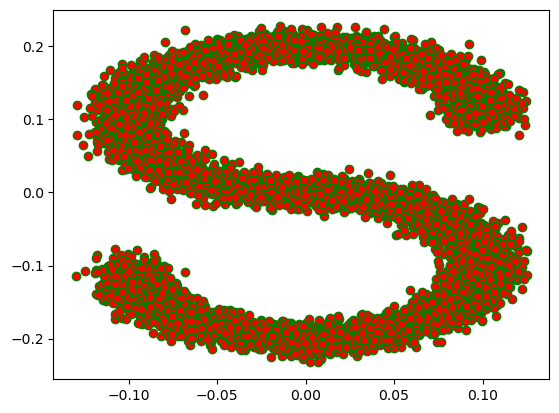

In [4]:
fig,ax = plt.subplots()
ax.scatter(*(s_curve.T),color="red",edgecolors="green")

In [5]:
dataset = t.FloatTensor(s_curve)
dataset.shape

torch.Size([10000, 2])

# define hyperparameters

$\alpha_t,\beta_t,\bar{\alpha}_t,\sqrt{\bar{\alpha}_t},\sqrt{\bar{\alpha}_{t-1}},\log (1-{\bar{\alpha}_t}),\sqrt{1-{\bar{\alpha}_t}}$

In [6]:
# total steps
num_steps=100
# beta of every steps
betas = t.linspace(-6,6,num_steps)
betas = t.sigmoid(betas)*(0.5e-2-1e-5)+1e-5

In [7]:
# calculate alpha, production of alpha,production alpha_{t-1},and \bar{alpha}
alphas=1.-betas
alphas_prod = t.cumprod(alphas,0)
alphas_prod_p = t.cat([t.tensor([1],dtype=t.float32),alphas_prod[:-1]],dim=0)
alphas_bar_sqrt = t.sqrt(alphas_prod)
one_minus_alphas_bar_log = t.log(1-alphas_prod)
one_minus_alphas_bar_sqrt = t.sqrt(1-alphas_prod)

print(one_minus_alphas_bar_log.shape)
# all the above variables' shape is [num_steps]

torch.Size([100])


# define forward procedure

$x_t = \sqrt{\bar{a}_t}x_0 + \sqrt{1-\bar{a}_t}z$

In [8]:
def q_x(x_0:t.Tensor,timestep:int):
    noise = t.randn_like(x_0) # use randn_like for matrix operation
    alphas_t = alphas_bar_sqrt[timestep]
    one_minus_alpha_bar_t = one_minus_alphas_bar_sqrt[timestep]

    #add noise using the above equation
    x_t = alphas_t*x_0+one_minus_alpha_bar_t*noise
    return x_t
    

# add noise on the original distribution(an example)

processing x99

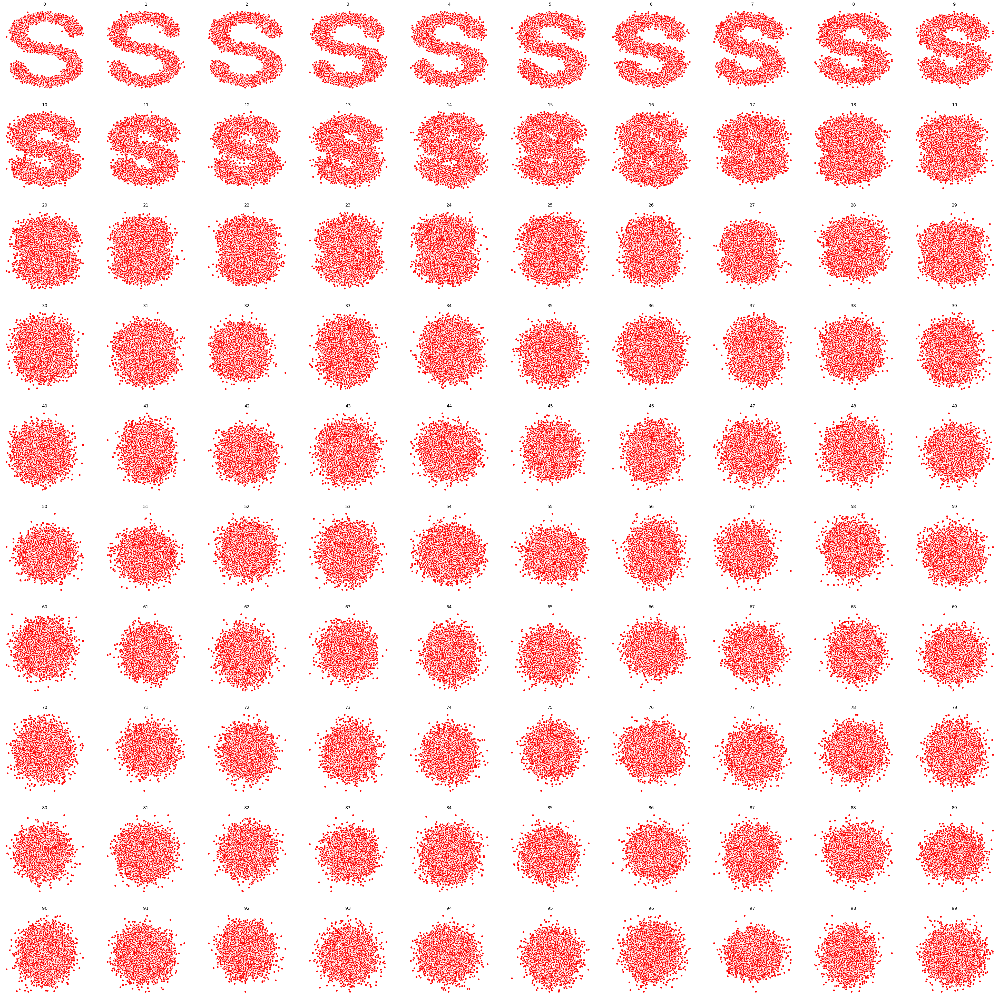

In [9]:
fix,axis = plt.subplots(10,10,figsize=(50,50))
plt.rc("text",color="blue")

for i in range(num_steps):
    print(f"\rprocessing x{i}",end="",flush=True)
    j=i//10
    k=i%10
    q_i = q_x(dataset,i)
    axis[j,k].scatter(q_i[:,0],q_i[:,1],color="red",edgecolor="white")
    axis[j,k].set_axis_off()
    axis[j,k].set_title(str(i))

# define backward procedure(reverse diffusion)

$\epsilon_\theta(x_t,t)$

In [10]:
import torch
import torch.nn as nn

class MLPDiffusion(nn.Module):
    def __init__(self,n_steps,num_units=128):
        super(MLPDiffusion,self).__init__()
        
        self.linears = nn.ModuleList(
            [
                nn.Linear(2,num_units),
                nn.ReLU(),
                nn.Linear(num_units,num_units),
                nn.ReLU(),
                nn.Linear(num_units,num_units),
                nn.ReLU(),
                nn.Linear(num_units,2),
            ]
        )
        self.step_embeddings = nn.ModuleList(
            [
                nn.Embedding(n_steps,num_units),
                nn.Embedding(n_steps,num_units),
                nn.Embedding(n_steps,num_units),
            ]
        )
    def forward(self,x,t):
        for idx,embedding_layer in enumerate(self.step_embeddings):
            t_embedding = embedding_layer(t)
            x = self.linears[2*idx](x)
            x += t_embedding
            x = self.linears[2*idx+1](x)
            
        x = self.linears[-1](x)
        
        return x

# define loss function

$$
L_{simple}(\theta)=\mathbb{E}_{x_0,\epsilon}\left[\vert\vert \epsilon - \epsilon_\theta(\sqrt{\bar{a}_t}x_0 + \sqrt{1-\bar{a}_t}\epsilon,t)\vert\vert^2\right]
$$

In [11]:
def diffusion_loss_function(model:nn.Module,
x_0:t.Tensor,
alphas_bar_sqrt:t.Tensor,
one_minus_alphas_bar_sqrt:t.Tensor,
n_steps:t.Tensor):

    batch_size = x_0.shape[0]
    # to aovid t being duplicate, we need to do some operations
    time_steps = t.randint(0,n_steps,size=(batch_size//2,))
    time_steps = t.cat([time_steps,n_steps-1-time_steps],dim=0)
    time_steps=time_steps.unsqueeze(-1)
    # get the coefficients of the variables
    a = alphas_bar_sqrt[time_steps]
    aml = one_minus_alphas_bar_sqrt[time_steps]
    # then we need a random noise
    eps = t.randn_like(x_0)

    # so, it is easy to construct the model's input data
    input_data = x_0*a + eps*aml
    
    output = model.forward(input_data,time_steps.squeeze(-1))
    # we just use the mse as the loss funtion
    return (eps-output).square().mean()


# define inference procedure

$$
x_{t-1} = \frac{1}{\sqrt{\alpha}_t}\left(x_t-\frac{1-\alpha_t}{\sqrt{1-\bar{\alpha}_t}}\epsilon_\theta(x_t,t) \right)+\sigma_t z
$$

In [12]:
def p_sample_loop(model,shape,n_steps,betas,one_minus_alphas_bar_sqrt):
    """
    restore x_0 from x_t, here we use a loop call of p_sample
    """
    cur_x = t.randn(shape)
    x_seq = [cur_x]
    for i in reversed(range(n_steps)):
        cur_x = p_sample(model,cur_x,i,betas,one_minus_alphas_bar_sqrt)
        x_seq.append(cur_x)
    return x_seq

def p_sample(model,x,timestep,betas,one_minus_alphas_bar_sqrt):
    """
    sample the reconstructed distribution of x_t-1 given x_t,
    just reference the equations in the above cell which is relevant
    clear
    """
    timestep = t.tensor([timestep])
    coeff = betas[timestep] / one_minus_alphas_bar_sqrt[timestep]
    eps_theta = model(x,timestep)
    mean = (1/(1-betas[timestep]).sqrt())*(x-(coeff*eps_theta))
    z = t.randn_like(x)
    sigma_t = betas[timestep].sqrt()
    sample = mean + sigma_t * z
    return (sample)

ep:[2000/4000],loss=0.368

C:\Users\shiku\AppData\Local\Temp\ipykernel_27436\4184818464.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axis = plt.subplots(1,10,figsize=(28,3))


ep:[3999/4000],loss=0.297

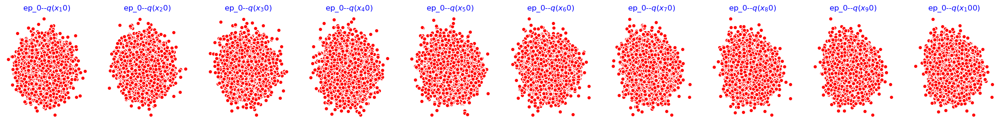

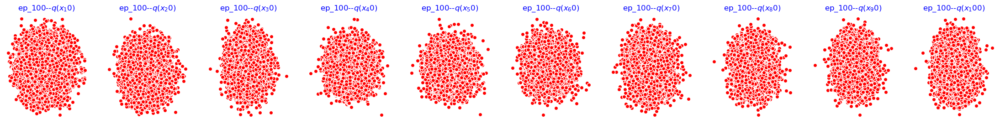

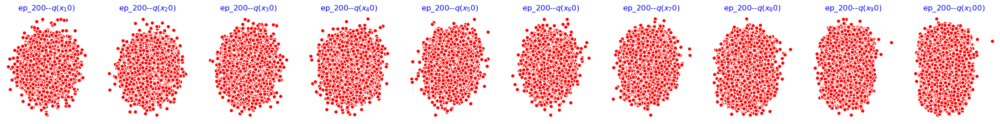

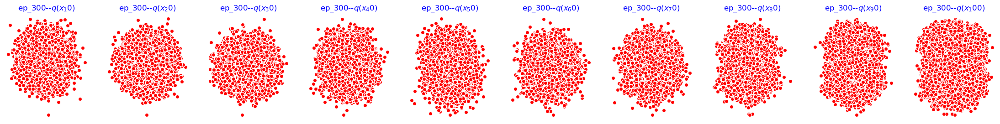

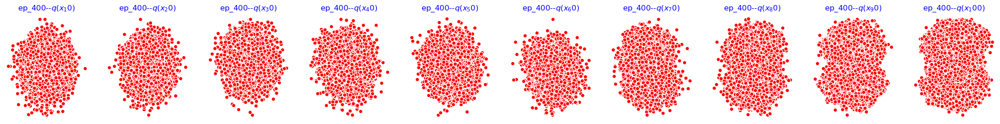

...

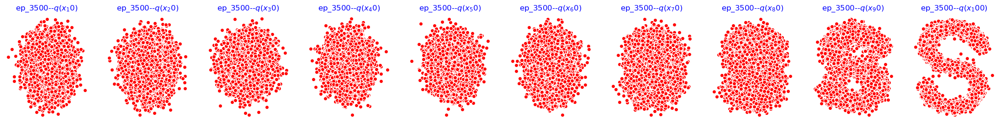

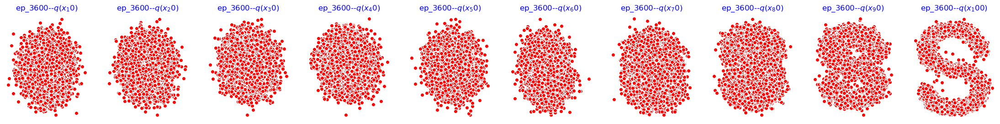

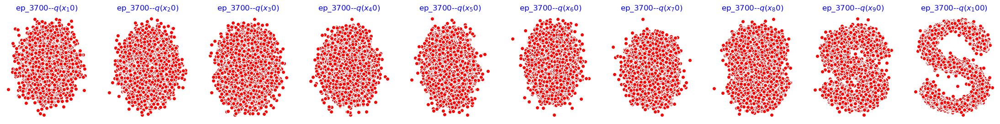

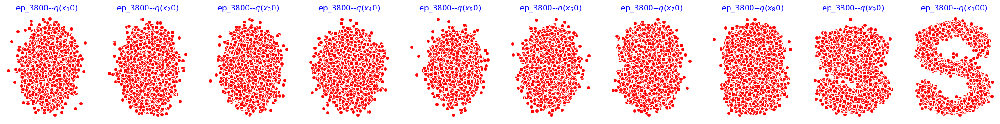

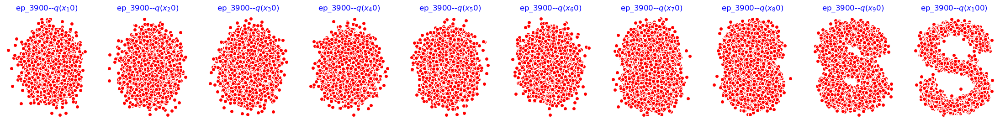

In [13]:
BATCH_SIZE = 128
dataloader = t.utils.data.DataLoader(dataset,batch_size=BATCH_SIZE,shuffle=True)
num_epoch = 4000
plt.rc("text",color = "blue")

model = MLPDiffusion(num_steps)
optimizer = t.optim.Adam(model.parameters(),lr=1e-3)

for ep in range(num_epoch):
    for idx,batch_x in enumerate(dataloader):
        loss =diffusion_loss_function(model,batch_x,alphas_bar_sqrt,one_minus_alphas_bar_sqrt,num_steps)
        optimizer.zero_grad()
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(),1.)
        optimizer.step()
    #log
    print("\rep:[{}/{}],loss={:.3f}".format(ep,num_epoch,loss.item()),end="")
    with t.no_grad():
        if (ep%100==0):
            x_seq = p_sample_loop(model,dataset.shape,num_steps,betas,one_minus_alphas_bar_sqrt)
            
            fig,axis = plt.subplots(1,10,figsize=(28,3))
            for i in range(1,11):
                q_i = x_seq[i*10].detach()
                axis[i-1].scatter(q_i[:,0],q_i[:,1],color="red",edgecolor="white")
                axis[i-1].set_axis_off()
                axis[i-1].set_title(f"ep_{ep}--$q(x_{str(i*10)})$")
                

# show the procedure of diffusion and the inversed operation

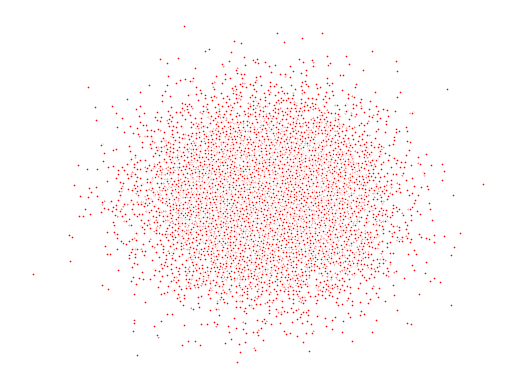

In [14]:
import io
from PIL import Image

imgs = []
for i in range(100):
    plt.clf()
    q_i = q_x(dataset,torch.tensor([i]))
    plt.scatter(q_i[:,0],q_i[:,1],color='red',edgecolor='white',s=5);
    plt.axis('off')
    
    img_buf = io.BytesIO()
    plt.savefig(img_buf,format='png')
    img = Image.open(img_buf)
    imgs.append(img)

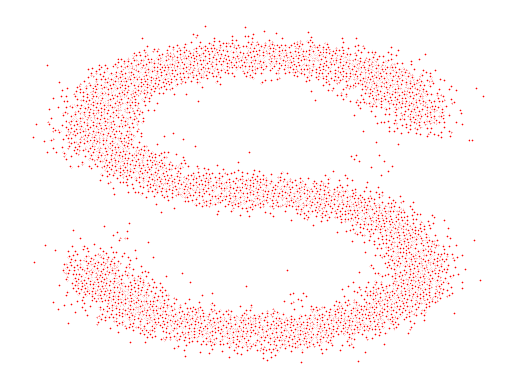

In [15]:
reverse = []
for i in range(100):
    plt.clf()
    cur_x = x_seq[i].detach()
    plt.scatter(cur_x[:,0],cur_x[:,1],color='red',edgecolor='white',s=5);
    plt.axis('off')
    
    img_buf = io.BytesIO()
    plt.savefig(img_buf,format='png')
    img = Image.open(img_buf)
    reverse.append(img)

In [16]:
imgs = imgs +reverse
imgs[0].save("diffusion.gif",format='GIF',append_images=imgs,save_all=True,duration=100,loop=0)